In [1]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import imutils
import tqdm

In [2]:
# !pip install imutils

In [3]:
image1=cv2.imread('obj1_5.JPG')
image1_rgb= cv2.cvtColor(image1, cv2.COLOR_BGR2RGB)
image1_gray = cv2.cvtColor(image1, cv2.COLOR_BGR2GRAY)

In [4]:
def plot_two_images(im1, im2):
  """
  Plot two images and return axis handles
  """
  ax1=plt.subplot(1,2,1)
  plt.imshow(im1)
  plt.axis('off')
  ax2=plt.subplot(1,2,2)
  plt.imshow(im2)
  plt.axis('off')
  return ax1, ax2

SIFT with default features¶
Apply SIFT keypoint detectors on the image \obj1 5.JPG ". Adjust peak and edge thresholds of the SIFT keypoint detector,such that a few hundred SIFT   keypoints are detected. Show the images showing the detected SIFT keypoints, superimposed on the original image for each detector separately, and report the thresholds you have chosen respectively. Describe which objects or regions in the image seem to generate large numbers of SIFT keypoints.

In [5]:
sift = cv2.SIFT_create()
"""
int 	nfeatures = 0,
int 	nOctaveLayers = 3,
double 	contrastThreshold = 0.04,
double 	edgeThreshold = 10,
double 	sigma = 1.6
"""
kp, des = sift.detectAndCompute(image1_gray,None)
keypoints_without_size = np.copy(image1)
keypoints_with_size = np.copy(image1)
cv2.drawKeypoints(image1, kp, keypoints_without_size, color = (0, 255, 0))
cv2.drawKeypoints(image1, kp, keypoints_with_size, flags = cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS, color = (0, 255, 0))
cv2.imwrite('Results/22a_sift_default_keypoints_without_size.jpg',keypoints_without_size)
cv2.imwrite('Results/22a_sift_default_keypoints_with_size.jpg',keypoints_with_size)
print('Number of keypoints:',len(kp))

Number of keypoints: 40727


(<Axes: >, <Axes: >)

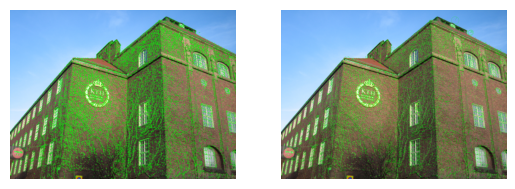

In [6]:
keypoints_without_size = cv2.cvtColor(keypoints_without_size, cv2.COLOR_BGR2RGB)
keypoints_with_size = cv2.cvtColor(keypoints_with_size, cv2.COLOR_BGR2RGB)
plot_two_images(keypoints_without_size, keypoints_with_size)

SIFT with adjusted threshold

In [7]:
sift = cv2.SIFT_create(
nfeatures = 0,
nOctaveLayers = 5,
contrastThreshold = 0.18,
edgeThreshold = 8,
sigma = 2.6
)

kp, des = sift.detectAndCompute(image1_gray,None)

keypoints_without_size = np.copy(image1)
keypoints_with_size = np.copy(image1)
cv2.drawKeypoints(image1, kp, keypoints_without_size, color = (0, 255, 0))
cv2.drawKeypoints(image1, kp, keypoints_with_size, flags = cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS, color = (0, 255, 0))
cv2.imwrite('Results/22a_sift_keypoints_without_size.jpg',keypoints_without_size)
cv2.imwrite('Results/22a_sift_keypoints_with_size.jpg',keypoints_with_size)
print('Number of keypoints:',len(kp))

Number of keypoints: 256


Repetability

Rotation

Plot repeatability versus rotation angle in increments of 15 degrees, from 0 degrees to 360 degrees for the two keypoint detectors. Comment on the robustness of the two keypoint detectors against rotation.

In [8]:
def rotatedPoints(kp1,image1,theta):
    """ Rotates coords by theta using afine transformation
       INPUT
       kp1 : keypoints from xfeature2d
       image1 : orig image for dimensions
       theta : rotation angle

       OUTPUT
       a
     """
    rotated= imutils.rotate_bound(image1,theta)
    (h, w) = image1.shape[:2]
    (cx, cy) = (w // 2, h // 2)
    (new_height, new_width) = rotated.shape[:2]
    (new_cx, new_cy) = (new_width // 2, new_height // 2)
    # print(cx,cy,new_cx,new_cy)


    for i in range(len(kp1)):
        # opencv calculates standard transformation matrix
        M = cv2.getRotationMatrix2D((cx, cy), theta, 1.0)
        # Grab  the rotation components of the matrix)
        cos = np.abs(M[0, 0])
        sin = np.abs(M[0, 1])
        # compute the new bounding dimensions of the image
        nW = int((h * sin) + (w * cos))
        nH = int((h * cos) + (w * sin))
        # adjust the rotation matrix to take into account translation
        M[0, 2] += (nW / 2) - cx
        M[1, 2] += (nH / 2) - cy
        # Prepare the vector to be transformed
        v = [kp1[i].pt[0],kp1[i].pt[1],1]
        # Perform the actual rotation and return the image
        calculated = np.dot(M,v)
        if i == 0 :
            new_bb = calculated
        else:
            new_bb= np.vstack((new_bb,calculated))
    return new_bb

In [9]:
def scale_coords(coords,scale):
    return np.array(scale)*coords

def rotate_coords(coords,deg,org_img,rot_img):
    """ Rotates coords clockwise by deg degrees
        coords must be np array """

    imCenterA = np.array(org_img.shape[:2])/2.
    imCenterB = np.array(rot_img.shape[:2])/2.

    transl_coords = coords - imCenterA

    theta = np.radians(deg)
    c = np.cos(theta)
    s = np.sin(theta)

    R = np.array([[c, -s], [s, c]])

    rotated_coords = np.dot(R,transl_coords.T).T

    retransl_coords = rotated_coords + imCenterB

    return retransl_coords

def check_matches(kps1,kps2,thr):
    """ kps1 are the keypoints of rotated image (matrix)
        kps2 are the rotated keypoints of image (matrix) """

    counter = 0
    curr_min = []
    # For each rotated keypoint
    for kp in kps1:

        # Computes L1-norm between kp and all keypoints in kps2 and
        # adds the number of keypoints that are within threshold thr of kp
        dist_mat = kp_dist_mat(kp,kps2)
        curr_min.append(min(dist_mat))
        counter += min(sum(dist_mat <= thr),1)

    return counter , curr_min


def kp_dist(kp1,kp2):
    return np.abs(kp1[0] - kp2[0]) + np.abs(kp1[1] - kp2[1])

def kp_dist_mat(kp,kp_mat):
    """ measures distance between kp1 and kp2
        here kp1 are the coords of a keypoint (np array) while kp2
        is a matrix with all other values to be checked """
    dist_mat= np.abs(kp[0] - kp_mat[:,0]) + np.abs(kp[1] - kp_mat[:,1])
    return dist_mat

def create_kp_mat(kp):
    """ create matrix from list of keypoints. easier to work with """
    kp_mat = np.empty((len(kp),2),dtype=np.double)

    for i,tmp_kp in enumerate(kp):
        kp_mat[i] = tmp_kp.pt

    return kp_mat

def origin_frac(deg):
    """ Computes fraction of where on x and y origin is on rotated image
    (x and y are top left corner in original img) """
    deg %= 360

    if 0 <= deg < 90:
        return np.sin((deg/360)*(2*np.pi)) , 0
    elif 90 <= deg < 180:
        return 1 , -np.cos((deg/360)*(2*np.pi))
    elif 180 <= deg < 270:
        return -np.cos((deg/360)*(2*np.pi)) , 1
    elif 270 <= deg < 360:
        return 0 , -np.sin((deg/360)*(2*np.pi))

def drawKeypoints_Array(img0,pts):
    """ Draws pts in the form of array on img0 """
    f,ax2 = plt.subplots(1, 1)
    cols = pts[:,0]
    rows = pts[:,1]
    ax2.imshow(cv2.cvtColor(img0, cv2.COLOR_BGR2RGB))
    ax2.scatter(cols, rows)
    plt.show()


def drawKeypoints_coords_as_txt(img0,pts):
    """ Draws pts in the form of array on img0 """
    f,ax2 = plt.subplots(1, 1)
    cols = pts[:,0]
    rows = pts[:,1]
    ax2.imshow(cv2.cvtColor(img0, cv2.COLOR_BGR2RGB))

    for x,y in pts:
        plt.text(x, y, F'({int(x)}, {int(y)})')

    plt.show()

In [10]:
sift = cv2.SIFT_create(nfeatures = 1000)
kp, des = sift.detectAndCompute(image1_gray,None)
keypoints_without_size = np.copy(image1)
keypoints_with_size = np.copy(image1)

In [11]:
cv2.drawKeypoints(image1, kp, keypoints_without_size, color = (0, 255, 0))
cv2.drawKeypoints(image1, kp, keypoints_with_size, flags = cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS, color = (0, 255, 0))
cv2.imwrite('Results/22a_sift_best_keypoints_without_size.jpg',keypoints_without_size)
cv2.imwrite('Results/22a_sift_best_keypoints_with_size.jpg',keypoints_with_size)

False

In [12]:
sift = cv2.SIFT_create(
nfeatures = 0,
nOctaveLayers = 3,
contrastThreshold = 0.18,
edgeThreshold = 8,
sigma =1.6
)

kp_sift, desc_sift = sift.detectAndCompute(image1_gray,None)
kp_sift_mat = create_kp_mat(kp_sift)
keypoints_with_size_test = np.copy(image1_gray)
keypoints_without_size_test = np.copy(image1_gray)

#outimg1 = cv2.drawKeypoints(image1_gray, kp_test, np.array([]), flags = cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS, color = (255, 255, 0))
#outimg2 = cv2.drawKeypoints(image1_gray, kp_test, np.array([]), color = (255, 255, 0))

print(F"Keypoints found SIFT: {len(kp_sift)}")

Keypoints found SIFT: 356


In [13]:
angles = np.arange(0,360 + 1,15)

# Save all counts in list
count_sift = []

for angle in tqdm.tqdm(angles,leave=False):
    # Rotate image by angle degrees and find kps
    rot_img = imutils.rotate_bound(image1_gray, angle)

    rot_kp_sift , _ = sift.detectAndCompute(rot_img,None)

    rot_kp_mat_sift = create_kp_mat(rot_kp_sift)

    # Rotate found keypoints in unrotated image by same angle
    org_rot_kp_mat_sift = rotatedPoints(kp_sift, image1_gray, -angle)

    # Check how many keypoints have matches within 2 pixels distance
    counter_sift , min_vals_sift = check_matches(rot_kp_mat_sift,org_rot_kp_mat_sift,2.)

    count_sift.append(counter_sift/len(kp_sift))

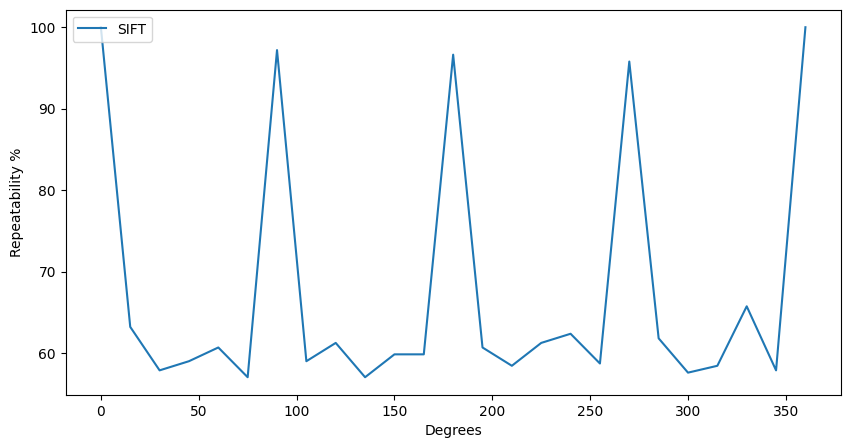

In [14]:
plt.figure(figsize=(10, 5))
plt.plot(angles, np.array(count_sift)*100, label='SIFT')
plt.legend(loc='upper left')
plt.xlabel('Degrees')
plt.ylabel('Repeatability %')

plt.savefig('repeatability_rot.png')

plt.show(
)

In [15]:
count_sift_scale = []

In [16]:
sift_scale = cv2.SIFT_create(nfeatures = 0,
nOctaveLayers = 3,
contrastThreshold = 0.18,
edgeThreshold = 8,
sigma =1.6)

kp_sift, desc_sift = sift_scale.detectAndCompute(image1_gray,None)
kp_sift_mat = create_kp_mat(kp_sift)

print(F"Keypoints found SIFT: {len(kp_sift)}")

Keypoints found SIFT: 356


In [17]:
m = 1.2
m_red = 1.2
scales = [m**k for k in range(0,8)]
red_scales = [m_red**k for k in range(0,8)]

h , w = np.shape(image1_gray)

In [18]:
for scale in tqdm.tqdm(red_scales,leave=False):
    image_copy = np.copy(image1_gray)

    scaled_img = cv2.resize(image_copy,(int(scale*w),int(scale*h)))

    print(F"Scale {scale}")
    print(F"Image dims: {scaled_img.shape}")

    scale_kp_sift , _ = sift_scale.detectAndCompute(scaled_img,None)

    print(F"SIFT found {len(scale_kp_sift)} keypoints")
    scale_kp_mat_sift = create_kp_mat(scale_kp_sift)

    # scaleate found keypoints in unscaleated image by same angle
    org_scale_kp_mat_sift = scale_coords(kp_sift_mat, scale)

    # Check how many keypoints have matches within 2 pixels distance
    counter_sift_scale , min_vals_sift_scale = check_matches(scale_kp_mat_sift,org_scale_kp_mat_sift,2.)

    count_sift_scale.append(counter_sift_scale/len(kp_sift))

  0%|          | 0/8 [00:00<?, ?it/s]

Scale 1.0
Image dims: (1944, 2592)


 12%|█▎        | 1/8 [00:00<00:02,  2.36it/s]

SIFT found 356 keypoints
Scale 1.2
Image dims: (2332, 3110)


 25%|██▌       | 2/8 [00:00<00:02,  2.02it/s]

SIFT found 220 keypoints
Scale 1.44
Image dims: (2799, 3732)


 38%|███▊      | 3/8 [00:01<00:03,  1.58it/s]

SIFT found 225 keypoints
Scale 1.7279999999999998
Image dims: (3359, 4478)


 50%|█████     | 4/8 [00:02<00:03,  1.15it/s]

SIFT found 221 keypoints
Scale 2.0736
Image dims: (4031, 5374)


 62%|██████▎   | 5/8 [00:04<00:03,  1.25s/it]

SIFT found 215 keypoints
Scale 2.4883199999999994
Image dims: (4837, 6449)


 75%|███████▌  | 6/8 [00:07<00:03,  1.85s/it]

SIFT found 219 keypoints
Scale 2.9859839999999993
Image dims: (5804, 7739)


 88%|████████▊ | 7/8 [00:12<00:02,  2.63s/it]

SIFT found 194 keypoints
Scale 3.583180799999999
Image dims: (6965, 9287)


SIFT found 207 keypoints


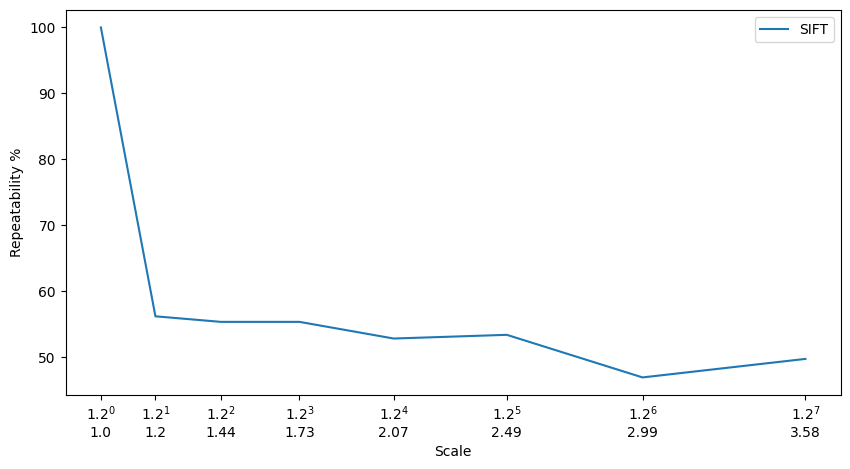

In [19]:
plt.figure(figsize=(10, 5))
plt.plot(red_scales, np.array(count_sift_scale)*100, label='SIFT')

locs = [m_red**i for i in range(8)]
labs = [F"${m_red}^{k}$\n{round(m_red**k,2)}" for k in range(0,8)]

plt.xticks(locs,labs)

plt.legend(loc='upper right')
plt.xlabel('Scale')
plt.ylabel('Repeatability %')

plt.savefig('repeatability_scale.png')

plt.show()

Image Feature Matching
(a) Extract a few hundred SIFT features from the test images.Show the feature keypoints superimposed on top of obj1 5.JPG and obj1 t5.JPG


In [20]:
image2=cv2.imread('obj1_t1.JPG')
image2_rgb= cv2.cvtColor(image2, cv2.COLOR_BGR2RGB)
image2_gray = cv2.cvtColor(image2, cv2.COLOR_BGR2GRAY)

Side by Side SIFT

In [21]:
kp1, des1 = sift.detectAndCompute(image1_gray,None)
kp2, des2 = sift.detectAndCompute(image2_gray,None)
keypoints_without_size1 = np.copy(image1)
keypoints_with_size1 = np.copy(image1)
keypoints_without_size2 = np.copy(image2)
keypoints_with_size2 = np.copy(image2)

cv2.drawKeypoints(image1, kp1, keypoints_without_size1, color = (0, 255, 0))
cv2.drawKeypoints(image1, kp1, keypoints_with_size1, flags = cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS, color = (0, 255, 0))
cv2.imwrite('Results/3a_sift_keypoints_without_size_image1.jpg',keypoints_without_size)
cv2.imwrite('Results/3a_sift_keypoints_with_size_image1.jpg',keypoints_with_size)

cv2.drawKeypoints(image2, kp2, keypoints_without_size2, color = (0, 255, 0))
cv2.drawKeypoints(image2, kp2, keypoints_with_size2, flags = cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS, color = (0, 255, 0))
cv2.imwrite('Results/3a_sift_keypoints_without_size_image2.jpg',keypoints_without_size2)
cv2.imwrite('Results/3a_sift_keypoints_with_size_image2.jpg',keypoints_with_size2)

print('Number of keypoints (image 1):',len(kp1))
print('Number of keypoints (image 2):',len(kp2))

Number of keypoints (image 1): 356
Number of keypoints (image 2): 535


In [22]:
def drawMatches_sideByside(img1,kp1,img2,kp2,matches,nnflag,label):

    if nnflag == False:
        img3 = cv2.drawMatches(img1, kp1, img2, kp2, matches,None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
    else:
        img3 = cv2.drawMatchesKnn(img1,kp1,img2,kp2,matches,None,flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
    plt.figure(figsize=(30, 30))
    plt.xticks([])
    plt.yticks([])
    plt.imshow(img3)
    plt.savefig(label)

(b) "Fixed threshold" matching algorithm.

In [23]:
bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)
matches = bf.match(des1,des2)
matches = sorted(matches, key = lambda x:x.distance)

Fixed threshold on SIFT

FileNotFoundError: [Errno 2] No such file or directory: 'Results/SIFT_Threshold_good_solution.png'

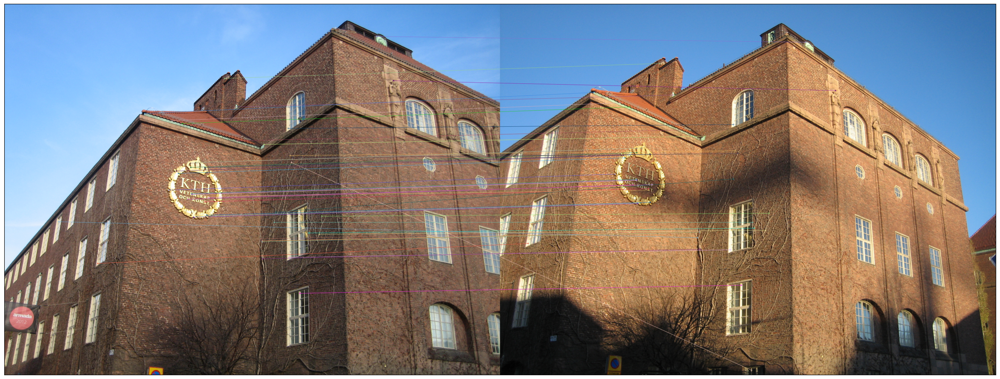

In [24]:
good=[]
for m in matches:
    if(m.distance<200):
        good.append(m)
drawMatches_sideByside(image1_rgb,kp1,image2_rgb,kp2,good,False,'Results/SIFT_Threshold_good_solution')

FileNotFoundError: [Errno 2] No such file or directory: 'Results/SIFT_Threshold_suboptimal_solution.png'

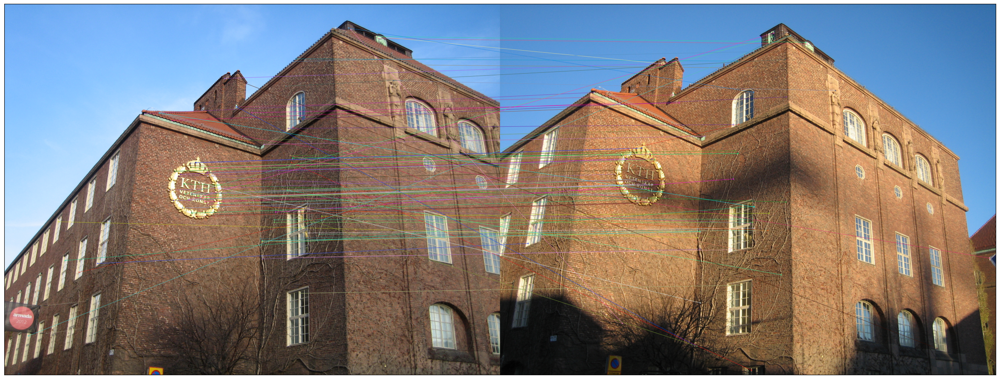

In [25]:
suboptimal=[]
for m in matches:
    if(m.distance<300):
        suboptimal.append(m)
drawMatches_sideByside(image1_rgb,kp1,image2_rgb,kp2,suboptimal,False,'Results/SIFT_Threshold_suboptimal_solution')

(c) "Nearest Neighbor" matching algorithm

In [ ]:
# BFMatcher with default params
bf = cv2.BFMatcher()
matches = bf.knnMatch(des1,des2,k=1)
drawMatches_sideByside(image1_rgb,kp1,image2_rgb,kp2,matches,True,'Results/SIFT_NN')

(d)"Nearest neighbor distance ratio" matching algorithm



In [ ]:
# BFMatcher with default params
bf = cv2.BFMatcher()
matches = bf.knnMatch(des1,des2,k=2)

# Apply ratio test
good = []
for m,n in matches:
    if m.distance < 0.75*n.distance:
        good.append([m])

suboptimal =[]
for m,n in matches:
    if m.distance < 0.90*n.distance:
        suboptimal.append([m])

drawMatches_sideByside(image1_rgb,kp1,image2_rgb,kp2,good,True,'Results/SIFT_NN_Ratio_good')
drawMatches_sideByside(image1_rgb,kp1,image2_rgb,kp2,suboptimal,True,'Results/SIFT_NN_Ratio_subopt')